# **Terrorist Attacks Classification**

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output

# **Data Acquisition**

In [100]:
train_set = pd.read_csv("classification_data/gtr_data.csv", low_memory=False)
test_set = pd.read_csv("classification_data/test.csv", low_memory=False)

# **Exploratory Data Analysis**

In [101]:
import plotly.express as px

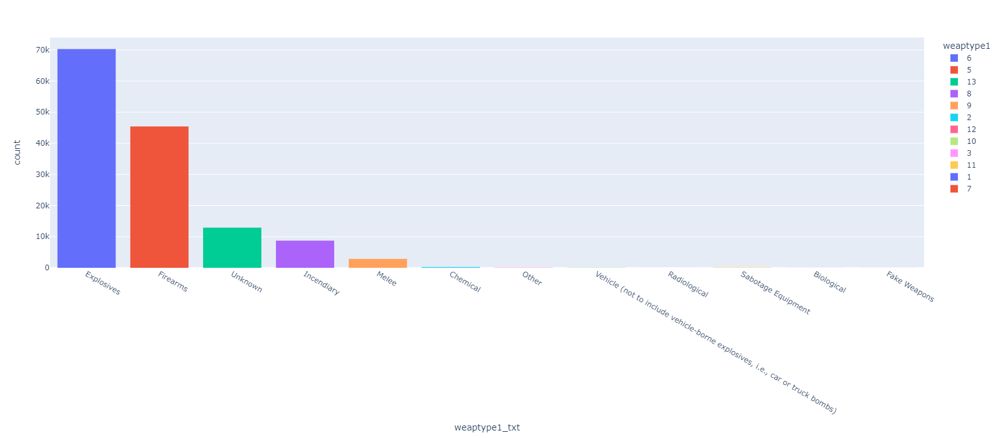

In [104]:
#หาว่าอาวุธชนิดใดถูกใช้งานมากที่สุด
px.histogram(train_set, x="weaptype1_txt",color="weaptype1", height = 700)

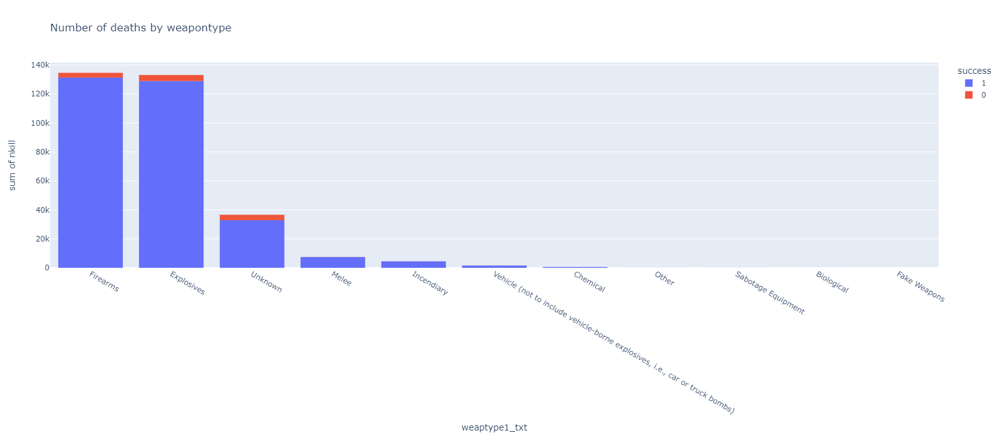

In [106]:
fig2 = px.histogram(train_set, x='weaptype1_txt', y='nkill', histfunc='sum',color="success",
                    title='Number of deaths by weapontype', height = 700).update_xaxes(categoryorder= 'total descending')
fig2.show()

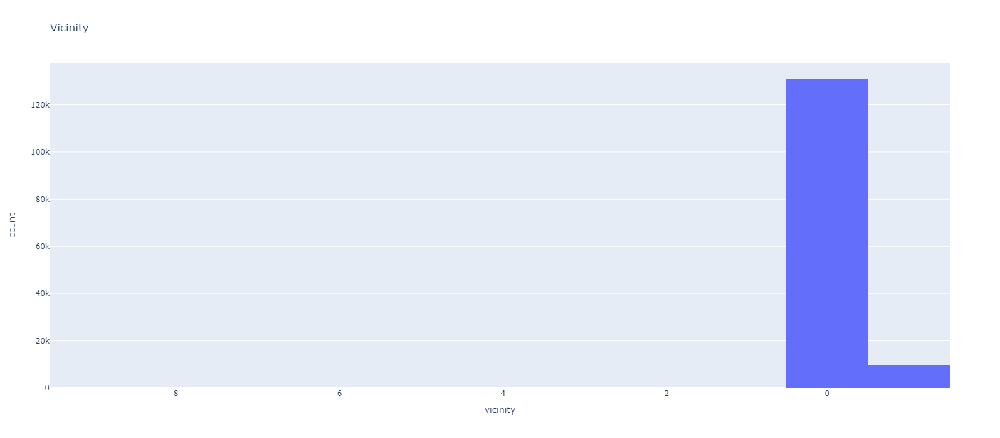

In [107]:
fig2 = px.histogram(train_set, x='vicinity',
                    title='Vicinity', height = 700)
fig2.show()

# **Data Preparation**

In [5]:
from sklearn import preprocessing
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from pandas_profiling import ProfileReport
import sweetviz as sv

In [6]:
def extracted_related(text):
    if text == "Unknown":
        return 0
    else:
        num = len(text.split(","))
        return num

In [7]:
def extract_summary(text):
    if text == "Unknown":
        return 0
    else:
        num = text.split(":")
        if len(num) >= 2:
            num = num.split()
        return len(num)

In [8]:
train_set["related"] = train_set["related"].astype("string").fillna("Unknown").apply(extracted_related)
test_set["related"] = test_set["related"].astype("string").fillna("Unknown").apply(extracted_related)

In [9]:
train_set["summary"] = train_set["summary"].astype("string").fillna("Unknown").apply(extracted_related)
test_set["summary"] = test_set["summary"].astype("string").fillna("Unknown").apply(extracted_related)

In [63]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
# Preprocess with pipeline 
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy = "mean")),
])
cat_pipline = Pipeline([
    ('imputer', SimpleImputer(strategy = "most_frequent")),
])
cat_onehot_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy = "most_frequent")),
])

In [11]:
num_att = ["nkill", "nwound", "latitude", "longitude", "iyear", "imonth", "iday", "related", "summary"]
cat_att = ["natlty1", "weaptype1", "weapsubtype1", "targsubtype1", "nperps", "nperpcap", "guncertain1", "individual",\
        "specificity", "country", "region", "crit1", "crit2", "crit3", "multiple", "success", "suicide", "attacktype1", "targtype1", "extended",]
onehot_att = ["ransom", "ishostkid", "vicinity", "doubtterr", "property", "INT_LOG", "INT_IDEO", "INT_MISC", "INT_ANY", "claimed"]
full_pipeline = ColumnTransformer([
    ("num", num_pipeline, num_att),
    ("cat", cat_pipline, cat_att),
    ("to_onehot", cat_onehot_pipeline, onehot_att),
    ("pass", preprocessing.OrdinalEncoder(), ["dbsource"]),
])

In [12]:
train_df = full_pipeline.fit_transform(train_set.drop(columns=["gname"]))
test_df = full_pipeline.transform(test_set)

In [15]:
gname_label = preprocessing.LabelEncoder()
X = train_df
y = gname_label.fit_transform(train_set["gname"])

In [90]:
X

array([[  0.        ,   4.        ,  32.927129  , ...,   1.        ,
          0.        ,  14.        ],
       [  1.        ,   0.        ,   6.202025  , ...,  -9.        ,
          0.        ,   4.        ],
       [  1.        ,   2.        ,  54.607712  , ...,   1.        ,
          0.        ,  13.        ],
       ...,
       [  2.40451694,   3.09363707, -34.891151  , ...,   1.        ,
          0.        ,  13.        ],
       [  2.        ,   2.        ,  34.516895  , ...,   0.        ,
          0.        ,  14.        ],
       [  2.40451694,   3.09363707,  13.64121   , ...,   0.        ,
          0.        ,  13.        ]])

## **Train Test Split**

In [71]:
from sklearn.model_selection import train_test_split

In [72]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0)

## **Standardization (For deep learning)**

In [73]:
scaler = preprocessing.StandardScaler()

In [74]:
# lower perfomance than upper method
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
clear_output()

# **Modeling**

In [18]:
import time
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, BatchNormalization, GRU
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping

from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier

clear_output()

In [19]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier

In [20]:
from skopt import BayesSearchCV
from skopt.space import Real, Integer

## **Random Forest**

In [21]:
# random_state 0 is the best now
clf = RandomForestClassifier(random_state=0, n_jobs=-1)

In [22]:
clf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=0)

In [23]:
pred_train_rf = clf.predict(X_train)
pred_test_rf = clf.predict(X_val)
acc_train_rf = accuracy_score(y_train, pred_train_rf)
acc_test_rf = accuracy_score(y_val, pred_test_rf)
clear_output()
print('****Train Results****')
print("Accuracy: {:.4%}".format(acc_train_rf))
print('****Test Results****')
print("Accuracy: {:.4%}".format(acc_test_rf))

****Train Results****
Accuracy: 99.9947%
****Test Results****
Accuracy: 91.0353%


In [26]:
clf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [27]:
result_rf = clf.predict(test_df)

## **LightGBM**

In [25]:
import lightgbm as lgb

In [42]:
lgbm = lgb.LGBMClassifier(n_jobs=-1, objective="multiclass", num_leaves =  59, 
                          learning_rate = 0.02, 
                          n_estimators = 450,
                          reg_alpha = 0.2,
                          reg_lambda = 0.5,
                          verbose = -1,
                         )

In [43]:
lgbm.fit(X, y)

LGBMClassifier(learning_rate=0.02, n_estimators=450, num_leaves=59,
               objective='multiclass', reg_alpha=0.2, reg_lambda=0.5,
               verbose=-1)

In [48]:
lgbm.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.02,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 450,
 'n_jobs': -1,
 'num_leaves': 59,
 'objective': 'multiclass',
 'random_state': None,
 'reg_alpha': 0.2,
 'reg_lambda': 0.5,
 'silent': True,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'verbose': -1}

In [40]:
pred_train_lgbm = lgbm.predict(X_train)
pred_test_lgbm = lgbm.predict(X_val)
acc_train_lgbm = accuracy_score(y_train, pred_train_lgbm)
acc_test_lgbm = accuracy_score(y_val, pred_test_lgbm)
clear_output()
print('****Train Results****')
print("Accuracy: {:.4%}".format(acc_train_lgbm))
print('****Test Results****')
print("Accuracy: {:.4%}".format(acc_test_lgbm))

****Train Results****
Accuracy: 99.9822%
****Test Results****
Accuracy: 91.6779%


In [44]:
result_lgbm = lgbm.predict(test_df)

## **XGBoost**

In [49]:
model_xgboost = XGBClassifier(n_estimators = 400,
                              eval_metrics = "mlogloss",
                              learning_rate = 0.02,
                              tree_method = "gpu_hist",
                              verbosity = 0,
                              n_jobs = -1,
                              reg_alpha = 0.7,
                              reg_lambda = 0.7,
                              max_leaves = 55,
                             )

In [50]:
result = model_xgboost.fit(X_train, y_train)

C:\Users\pond\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


In [51]:
model_xgboost.get_params()

{'objective': 'multi:softprob',
 'use_label_encoder': True,
 'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'gpu_id': 0,
 'importance_type': 'gain',
 'interaction_constraints': '',
 'learning_rate': 0.02,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 400,
 'n_jobs': -1,
 'num_parallel_tree': 1,
 'random_state': 0,
 'reg_alpha': 0.7,
 'reg_lambda': 0.7,
 'scale_pos_weight': None,
 'subsample': 1,
 'tree_method': 'gpu_hist',
 'validate_parameters': 1,
 'verbosity': 0,
 'eval_metrics': 'mlogloss',
 'max_leaves': 55}

In [52]:
pred_train = model_xgboost.predict(X_train)
pred_test = model_xgboost.predict(X_val)
acc_train_xgb = accuracy_score(y_train, pred_train)
acc_test_xgb = accuracy_score(y_val, pred_test)
print('****Train Results****')
print("Accuracy: {:.4%}".format(acc_train_xgb))
print('****Test Results****')
print("Accuracy: {:.4%}".format(acc_test_xgb))

****Train Results****
Accuracy: 96.1726%
****Test Results****
Accuracy: 91.1027%


## **Deep Neural Network**

In [75]:
model = Sequential()
model.add(Dense(256, activation = "relu", input_shape = (X_train.shape[1],)))
model.add(Dropout(0.1))

model.add(Dense(len(np.unique(y_train)),  activation = "softmax"))

opt = tf.keras.optimizers.Adam(learning_rate = 0.001)

model.compile(loss = "categorical_crossentropy",
             optimizer = opt,
             metrics = ['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 256)               10496     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 418)               107426    
                                                                 
Total params: 117,922
Trainable params: 117,922
Non-trainable params: 0
_________________________________________________________________


In [76]:
y_train_dl = tf.keras.utils.to_categorical(y_train)

In [77]:
y_train_dl_all = tf.keras.utils.to_categorical(y)

In [78]:
history = model.fit(
                    X_train,
                    y_train_dl,
                    batch_size = 256,
                    epochs = 100,
                    validation_split=0.2,
                   )

Epoch 1/100
353/353 [==============================] - 7s 18ms/step - loss: 1.9274 - accuracy: 0.6502 - val_loss: 1.1681 - val_accuracy: 0.7393
Epoch 2/100
353/353 [==============================] - 6s 18ms/step - loss: 1.0127 - accuracy: 0.7566 - val_loss: 0.9040 - val_accuracy: 0.7751
Epoch 3/100
353/353 [==============================] - 6s 18ms/step - loss: 0.8314 - accuracy: 0.7841 - val_loss: 0.7981 - val_accuracy: 0.7940
Epoch 4/100
353/353 [==============================] - 7s 19ms/step - loss: 0.7433 - accuracy: 0.7966 - val_loss: 0.7473 - val_accuracy: 0.8033
Epoch 5/100
353/353 [==============================] - 6s 18ms/step - loss: 0.6877 - accuracy: 0.8084 - val_loss: 0.7083 - val_accuracy: 0.8133
Epoch 6/100
353/353 [==============================] - 7s 19ms/step - loss: 0.6466 - accuracy: 0.8170 - val_loss: 0.6854 - val_accuracy: 0.8175
Epoch 7/100
353/353 [==============================] - 6s 18ms/step - loss: 0.6170 - accuracy: 0.8222 - val_loss: 0.6649 - val_accuracy:

In [79]:
y_pred_train = np.argmax(model.predict(X_train), axis = 1)
y_pred_test = np.argmax(model.predict(X_val), axis = 1)
acc_test_dnn = accuracy_score(y_val, y_pred_test)
acc_train_dnn = accuracy_score(y_train, y_pred_train)
print('****Train Results****')
print("Accuracy: {:.4%}".format(acc_train_dnn))
print('****Test Results****')
print("Accuracy: {:.4%}".format(acc_test_dnn))

****Train Results****
Accuracy: 92.2538%
****Test Results****
Accuracy: 86.2813%


# **Evaluation**

In [80]:
import plotly.express as px

build data frame for model comparison

In [81]:
model_list = ['Random Forest', 'LightGBM', 'XGBoost', 'DNN']
acc = [acc_train_rf, acc_test_rf, acc_train_lgbm, acc_test_lgbm, acc_train_xgb, acc_test_xgb, acc_train_dnn, acc_test_dnn]
model_l = []
type_acc = []
acc_df = pd.DataFrame()
for i in model_list:
    for j in ['Train', 'Test']:
        model_l.append(i)
        type_acc.append(j)

In [83]:
acc_dict = {
            'Accuracy' : acc,
            'Model': model_l,
            'Type': type_acc
        }
acc_df = pd.DataFrame(acc_dict)

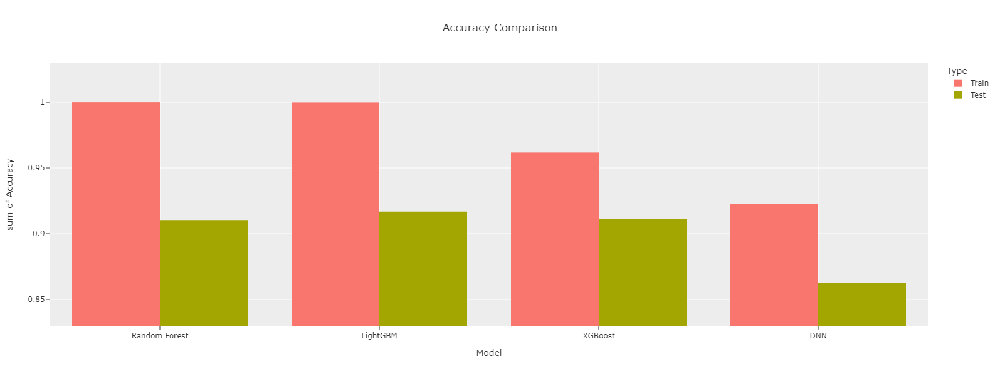

In [87]:
fig = px.histogram(acc_df, x="Model", y="Accuracy",
             color='Type', barmode='group', template = 'ggplot2',
             height=600, title = "Accuracy Comparison")
fig.update_layout(yaxis_range=[0.83,1.03])
fig.show()

In [88]:
acc_df[acc_df["Type"] == "Train"]

,Accuracy,Model,Type
0,0.999947,Random Forest,Train
2,0.999822,LightGBM,Train
4,0.961726,XGBoost,Train
6,0.922538,DNN,Train


In [89]:
acc_df[acc_df["Type"] == "Test"]

,Accuracy,Model,Type
1,0.910353,Random Forest,Test
3,0.916779,LightGBM,Test
5,0.911027,XGBoost,Test
7,0.862813,DNN,Test


LightGBM is the best model here

## **Get result**

In [45]:
def save_result(predict_result):
    test_result = pd.DataFrame()
    test_result["Category"] = gname_label.inverse_transform(predict_result)
    test_result["Index"] = test_result.index
    test_result = test_result[["Index", "Category"]]
    test_result.to_csv("classification_result/Classification_62070242_62070278_62070285.csv", index = False)
    return test_result

In [46]:
# change variable name in argument to change model prediction result
test_result = save_result(result_lgbm)

In [93]:
test_result["Category"].unique()

array(['Unknown', 'Khmer Rouge', 'Kosovo Liberation Army (KLA)',
       'Islamic State of Iraq and the Levant (ISIL)',
       'Farabundo Marti National Liberation Front (FMLN)',
       'Barqa Province of the Islamic State',
       'Communist Party of India - Maoist (CPI-Maoist)', 'Palestinians',
       'Taliban', 'Abu Sayyaf Group (ASG)',
       'National Liberation Army of Colombia (ELN)',
       'Armed Islamic Group (GIA)', 'Jaish-e-Islam',
       'Corsican National Liberation Front (FLNC)',
       'Liberation Tigers of Tamil Eelam (LTTE)',
       "Donetsk People's Republic", 'Ulster Freedom Fighters (UFF)',
       "New People's Army (NPA)", 'The Extraditables',
       'Palestinian Extremists', 'Al-Shabaab',
       'Azawad National Liberation Movement (MNLA)', 'Al-Qaida in Iraq',
       'Moro Islamic Liberation Front (MILF)', 'Shining Path (SL)',
       'Revolutionary Armed Forces of Colombia (FARC)',
       'Kashmiri extremists', 'Montoneros (Argentina)',
       'Sindhudesh Revoluti